In [1]:
using Plots
using TensorCrossInterpolation, LinearAlgebra
using QuanticsTCI
using QuanticsGrids
using ITensorMPS
using ITensors
using NDTensors
using TCIITensorConversion
using IterativeSolvers
using LinearMaps
using LinearAlgebra
using HDF5
include("src/2D_QIS.jl")
plotlyjs()

Plots.PlotlyJSBackend()

In [2]:
R = 10
delta_t = 0.1 * 2.0^-(R-1)
xvals = collect(range(0, 1, 2^R))
yvals = collect(range(0, 1, 2^R))

file_name = "velocityfieldsMPS_chi_39_v1.h5"

"velocityfieldsMPS_chi_39_v1.h5"

In [3]:
data = h5open(file_name, "r")
T = read(data, "total_simulation_time")
m, sek = Int(div(T,60)), trunc(T%60, digits=4)
h, m = div(m, 60), m % 60
d, h = div(h, 24), h % 24
print("$d d | $h h | $m min | $sek sek")
close(data)

2 d | 9 h | 19 min | 55.771 sek

In [4]:
i = 500

data = h5open(file_name, "r")
mps = read(data, "/uy_t_$i", MPS)
mps_array = mps_to_array_2D(mps)
mps_array[abs.(mps_array) .< 1e-5] .= 0.
p = contour(xvals, yvals, mps_array, fill=true, title="t = $(trunc(i * delta_t * 1e3, digits=1)) ms")
savefig(p, "figure.pdf")
close(data)

┌ Info: Saved animation to /Users/niklasbliemel/Work/krones/krones_QIS/uy_t.gif
└ @ Plots /Users/niklasbliemel/.julia/packages/Plots/zgMHY/src/animation.jl:156


Plots.AnimatedGif("/Users/niklasbliemel/Work/krones/krones_QIS/uy_t.gif")
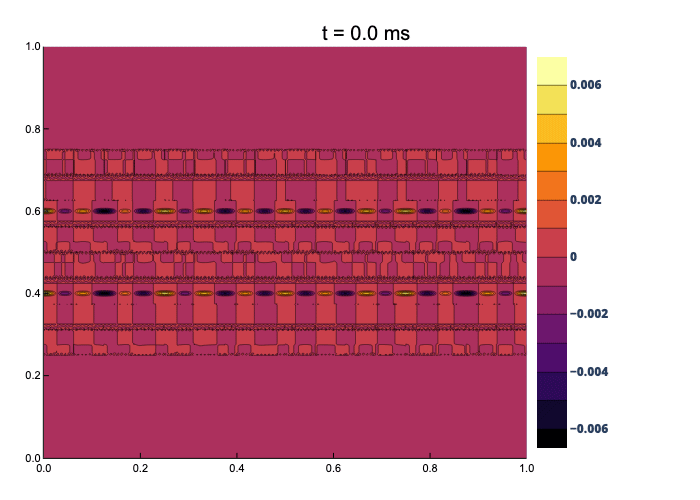

In [5]:
data = h5open(file_name, "r")
anim = @animate for i in 0:500
    mps = read(data, "/uy_t_$i", MPS)
    mps_array = mps_to_array_2D(mps)
    contour(xvals, yvals, mps_array, fill=true, title="t = $(trunc(i * delta_t * 1000, digits=1)) ms")
end
close(data)

gif(anim, "uy_t.gif", fps=30)